# Setting up colab and environment.

In [ ]:
!mkdir data dumps

In [ ]:
!pip install -U sentence-transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 85 kB 1.8 MB/s 
     |████████████████████████████████| 5.8 MB 40.3 MB/s 
     |████████████████████████████████| 1.3 MB 16.3 MB/s 
     |████████████████████████████████| 182 kB 18.5 MB/s 
     |████████████████████████████████| 7.6 MB 9.0 MB/s 
  Created wheel for sentence-transformers: filename=sentence_transformers-2.2.2-py3-none-any.whl size=125938 sha256=997bed7c1a04fc8d38d6af963185c989d54efdd408647bd1f7aeec7a2c7aca31
  Stored in directory: /root/.cache/pip/wheels/5e/6f/8c/d88aec621f3f542d26fac0342bef5e693335d125f4e54aeffe
Successfully built sentence-transformers


In [ ]:
!wget https://raw.githubusercontent.com/michaelvin1322/Python_for_Data_Science_final-project/main/data/train.csv -O data/train.csv
!wget https://github.com/michaelvin1322/Python_for_Data_Science_final-project/blob/main/dumps/text_vectorized.pkl?raw=true -O dumps/text_vectorized.pkl
!wget https://github.com/michaelvin1322/Python_for_Data_Science_final-project/blob/main/dumps/text_vectorized.pkl?raw=true -O dumps/title_vectorized.pkl

--2022-12-16 07:48:37--  https://raw.githubusercontent.com/michaelvin1322/Python_for_Data_Science_final-project/main/data/train.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 98628550 (94M) [text/plain]
Saving to: ‘data/train.csv’

data/train.csv      100%[===================>]  94.06M   305MB/s    in 0.3s    

2022-12-16 07:48:41 (305 MB/s) - ‘data/train.csv’ saved [98628550/98628550]

--2022-12-16 07:48:41--  https://github.com/michaelvin1322/Python_for_Data_Science_final-project/blob/main/dumps/text_vectorized.pkl?raw=true
Resolving github.com (github.com)... 140.82.114.4
Connecting to github.com (github.com)|140.82.114.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/michaelvin1322/Python_for_Data_S

In [ ]:
import pickle
import os.path

import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

from itertools import combinations
from sentence_transformers import SentenceTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline



In [ ]:
if os.path.isfile("dumps/text_vectorized.pkl"):
  with open("dumps/text_vectorized.pkl", 'rb') as fid:
     text_vectorized = pickle.load(fid)
else:
  text_vectorized = SentenceTransformer('all-mpnet-base-v2').encode(df["text"])


if os.path.isfile("dumps/title_vectorized.pkl"):
  with open("dumps/title_vectorized.pkl", 'rb') as fid:
     title_vectorized = pickle.load(fid)
else:
  title_vectorized = SentenceTransformer('all-mpnet-base-v2').encode(df["text"])

#Loading and cleaning data

In [ ]:
df = pd.read_csv("data/train.csv", index_col="id")
df.head()

,title,author,text,label
id,,,,
0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1
1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0
2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1
3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1
4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20800 entries, 0 to 20799
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   title   20242 non-null  object
 1   author  18843 non-null  object
 2   text    20761 non-null  object
 3   label   20800 non-null  int64 
dtypes: int64(1), object(3)
memory usage: 812.5+ KB


In [ ]:
df.isna().sum()

title      558
author    1957
text        39
label        0
dtype: int64

In [ ]:
df["title"].fillna(value="", inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20800 entries, 0 to 20799
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   title   20800 non-null  object
 1   author  18843 non-null  object
 2   text    20761 non-null  object
 3   label   20800 non-null  int64 
dtypes: int64(1), object(3)
memory usage: 812.5+ KB


#Note about signal leakage

While we were studying dataset we mentionet that the majority of authors has neither all fake news nor all "good" news. So the most naive way to classify data would be to use Author field. Our assumption is that it might be result of how data were marked.

In [ ]:
authors_df = pd.DataFrame({}, index=df['author'].unique())
authors_label_map = (
    (0, 'neg'),
    (1, 'pos'),
)




for val, col in authors_label_map:
  authors_df[col] = df[df['label'] == val].groupby('author').size()
  authors_df[col] = authors_df[col].fillna(0)
  authors_df[col] = authors_df[col].astype(int)

authors_df.head()


,neg,pos
Darrell Lucus,0,10
Daniel J. Flynn,17,0
Consortiumnews.com,0,58
Jessica Purkiss,0,1
Howard Portnoy,0,44


In [ ]:
authors_df['count'] = authors_df['pos'] + authors_df['neg']
authors_df = authors_df.sort_values('count', ascending=False)

authors_df[(authors_df['pos'] > 0) & (authors_df['neg'] > 0)]

,neg,pos,count
Pam Key,242,1,243
Ann Coulter,16,5,21
Reuters,4,2,6
Pamela Geller,1,4,5
AFP,2,1,3


# EDA

In [ ]:
pca_transformer = Pipeline([
    ('scaling', StandardScaler()), 
    ('pca', PCA(n_components=4))]
                           )

text_pca = pca_transformer.fit_transform(text_vectorized)

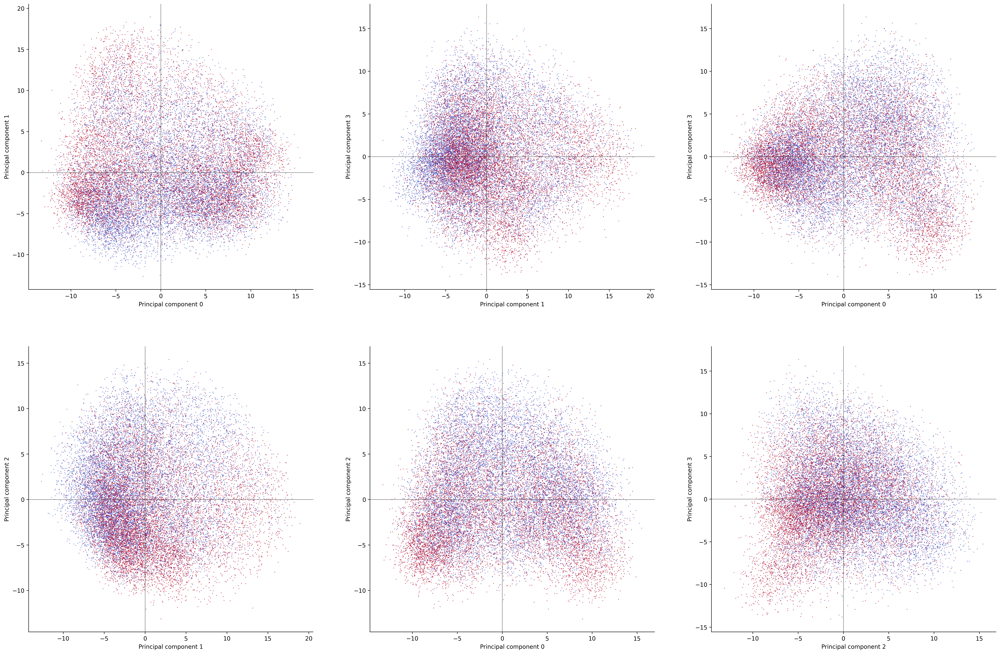

In [ ]:

fig, axs = plt.subplots(2, 3, clear=True)

fig.set_size_inches(30, 20)
fig.set_dpi(300)

for n, (i, j) in enumerate(combinations(range(4), 2)):
  ax = axs[n%2][n%3]


  ax.scatter(text_pca[:, i], text_pca[:, j], c=df["label"], s=.1, cmap="coolwarm");
  ax.set_xlabel(f"Principal component {i}")
  ax.set_ylabel(f"Principal component {j}")
  
  ax.spines['top'].set_position(('data',0))
  ax.spines['top'].set_color('black') # this helps change the color
  ax.spines['top'].set_alpha(.5) # and adds some transparency to the spines
  ax.spines['right'].set_position(('data',0))
  ax.spines['right'].set_color('black') # this helps change the color
  ax.spines['right'].set_alpha(.5) # and adds some transparency to the spines

plt.savefig('pca_viz.png')

#Training classifiers

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

x_train, x_test, y_train, y_test = train_test_split(text_vectorized, df['label'], test_size=0.25, random_state=0)
logisticRegr = LogisticRegression()
logisticRegr.fit(x_train, y_train)
predictions = logisticRegr.predict(x_test)
score = logisticRegr.score(x_test, y_test)
print(score)

0.9132692307692307


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

title_vectorized = SentenceTransformer('all-mpnet-base-v2').encode(df["title"])
x_train, x_test, y_train, y_test = train_test_split(title_vectorized, df['label'], test_size=0.25, random_state=0)
logisticRegr = LogisticRegression()
logisticRegr.fit(x_train, y_train)
predictions = logisticRegr.predict(x_test)
score = logisticRegr.score(x_test, y_test)
print(score)

Downloading:   0%|          | 0.00/1.18k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/571 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/116 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/39.3k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/438M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/239 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/363 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/13.1k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/349 [00:00<?, ?B/s]

In [ ]:
x_train

array([[ 0.03933977,  0.14990458,  0.0282086 , ...,  0.0333176 ,
        -0.08787763, -0.03672148],
       [ 0.02682532,  0.12647264,  0.008962  , ..., -0.03993336,
        -0.03791318, -0.03411008],
       [-0.01719973,  0.08479167, -0.01473367, ...,  0.05610996,
        -0.07266172,  0.06637181],
       ...,
       [-0.03398234,  0.125825  ,  0.02217848, ..., -0.00229345,
        -0.01868834,  0.02603621],
       [ 0.05303877,  0.12216561,  0.00170121, ...,  0.00032547,
        -0.01166436, -0.02221857],
       [-0.04888023,  0.1330209 ,  0.01306842, ...,  0.00736015,
         0.00935715, -0.02500775]], dtype=float32)